In [2]:
# open a file as csv without header

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os,natsort


In [2]:
imagenet_target_dir ='/mydata/pytorch_custom_log_one_epoch_imagenet_dataset/'
synthetic_target_dir ='/mydata/pytorch_custom_log_one_epoch_synthetic_dataset/'
sort_criteria = 'name' # or 'duration'

In [3]:
# sort_by = 'name' or 'duration'
def plotter_preprocessing_time(target_dir,sort_by='name',fig_size=(50,10),remove_outliers=True,fig_prefix=''):
    
    root_to_files = {}
    for root, dirs, files in os.walk(target_dir):
        root_to_files[root] = files
    roots = sorted(root_to_files, key=lambda x: natsort.natsort_key(x.lower()))

    prev_batch = None
    for root in roots:
        print(root)
        files = root_to_files[root]
        plot_df = pd.DataFrame()
        
        for file in files:
            if not file.startswith('custom_log_worker_pid_'):
                continue

            df = pd.read_csv(os.path.join(root, file)
                            , header=None)

            # add header
            df.columns = ['name','start_ts','duration']

            # names that start with 'SBatchPreprocessed'
            df = df[df['name'].str.startswith('SBatchPreprocessed')]
            # map 'SBatchPreprocessed_' such that 'SBatchPreprocessed_idx' becomes 'idx' where idx is an integer
            df['name'] = df['name'].map(lambda x: int(x.replace('SBatchPreprocessed_','')))


            # divide by 1000 to convert from nanoseconds to microseconds
            df['duration'] = df['duration']/1000

            # concatentate all dataframes
            plot_df = pd.concat([plot_df, df])
        
        if plot_df.empty:
            continue
        def remove_wild_outliers(plot_df):
            # mean and std before removing outliers
            mean = np.mean(plot_df["duration"])
            std = np.std(plot_df["duration"])
            print (f'Before removing outliers:')
            print(f'avg = {mean:.2f} usecs, std = {std:.2f} ({100*std/mean:.2f}% of avg) usecs , min = {plot_df["duration"].min():.2f} usecs, max = {plot_df["duration"].max():.2f} usecs')
            # remove rows with duration's > mean - 2*std and < mean + 2*std
            plot_df = plot_df[plot_df['duration'] < plot_df['duration'].mean() + 2*plot_df['duration'].std()]
            plot_df = plot_df[plot_df['duration'] > plot_df['duration'].mean() - 2*plot_df['duration'].std()] 
            # mean and std after removing outliers
            print (f'After removing outliers:')
            return plot_df

        batch = root.split('/')[-1].split('b')[1].split('_')[0] # <long_dir_path> -> 128_gpu4 -> 128

        label = root.split('/')[-1] # retrieves b128_gpu4 kind of label
        print(f'{label}:')
        # remove outliers
        if remove_outliers:
            plot_df = remove_wild_outliers(plot_df)

        if prev_batch is None:
            prev_batch = batch 
        elif batch != prev_batch:

            # plt.figure(figsize=fig_size)
            plt.gcf().set_size_inches(fig_size[0], fig_size[1])
            # label x axis
            plt.xlabel(f'Batch ids preprocessed (sorted by {sort_by}) (batch size = {prev_batch})')
            # label y axis
            plt.ylabel('Batch preprocessing elapsed time in usecs')
            plt.legend()
            
            plt.show()
            prev_batch = batch            
        
        mean = np.mean(plot_df["duration"])
        std = np.std(plot_df["duration"])
        print (f'avg = {mean:.2f} usecs, std = {std:.2f} ({100*std/mean:.2f}% of avg) usecs, min = {plot_df["duration"].min():.2f} usecs, max = {plot_df["duration"].max():.2f} usecs')
        plot_df = plot_df.sort_values(by=[sort_by])
        plt.plot(plot_df['name'], plot_df['duration'], label=label, marker='s')
        # plot on log scale
        plt.yscale('log')

    # plt.figure(figsize=fig_size)
    plt.gcf().set_size_inches(fig_size[0], fig_size[1])
    # label x axis
    plt.xlabel(f'Batch ids preprocessed (sorted by {sort_by})')
    # label y axis
    plt.ylabel('Batch preprocessing elapsed time in usecs')
    plt.legend()    
    plt.show()



/mydata/pytorch_custom_log_one_epoch_imagenet_dataset/
/mydata/pytorch_custom_log_one_epoch_imagenet_dataset/b128_gpu1
b128_gpu1:
Before removing outliers:
avg = 1527832.66 usecs, std = 330588.25 (21.64% of avg) usecs , min = 237382.06 usecs, max = 2883985.16 usecs
After removing outliers:
avg = 1483535.42 usecs, std = 279058.30 (18.81% of avg) usecs, min = 1046096.95 usecs, max = 2188739.88 usecs
/mydata/pytorch_custom_log_one_epoch_imagenet_dataset/b128_gpu2
b128_gpu2:
Before removing outliers:
avg = 1444287.18 usecs, std = 308083.96 (21.33% of avg) usecs , min = 272110.81 usecs, max = 2930642.04 usecs
After removing outliers:
avg = 1410212.12 usecs, std = 267906.30 (19.00% of avg) usecs, min = 940443.90 usecs, max = 2059856.68 usecs
/mydata/pytorch_custom_log_one_epoch_imagenet_dataset/b128_gpu3
b128_gpu3:
Before removing outliers:
avg = 1460443.50 usecs, std = 323745.16 (22.17% of avg) usecs , min = 188383.78 usecs, max = 2908414.99 usecs
After removing outliers:
avg = 1424639.28 u

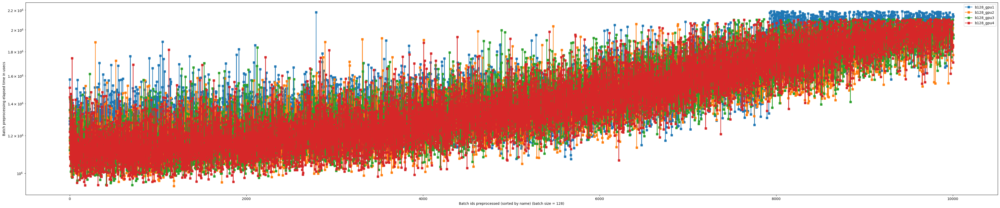

avg = 3237378.74 usecs, std = 930075.70 (28.73% of avg) usecs, min = 1944191.46 usecs, max = 5187261.02 usecs
/mydata/pytorch_custom_log_one_epoch_imagenet_dataset/b256_gpu2
b256_gpu2:
Before removing outliers:
avg = 2959994.58 usecs, std = 484790.50 (16.38% of avg) usecs , min = 1926350.02 usecs, max = 4480619.20 usecs
After removing outliers:
avg = 2939136.44 usecs, std = 463822.81 (15.78% of avg) usecs, min = 2047242.97 usecs, max = 3928726.41 usecs
/mydata/pytorch_custom_log_one_epoch_imagenet_dataset/b256_gpu3
b256_gpu3:
Before removing outliers:
avg = 2605075.30 usecs, std = 302789.85 (11.62% of avg) usecs , min = 1510302.37 usecs, max = 3933157.38 usecs
After removing outliers:
avg = 2585207.58 usecs, std = 278758.44 (10.78% of avg) usecs, min = 2029049.99 usecs, max = 3210701.61 usecs
/mydata/pytorch_custom_log_one_epoch_imagenet_dataset/b256_gpu4
b256_gpu4:
Before removing outliers:
avg = 2435063.01 usecs, std = 236947.74 (9.73% of avg) usecs , min = 1486002.65 usecs, max = 37

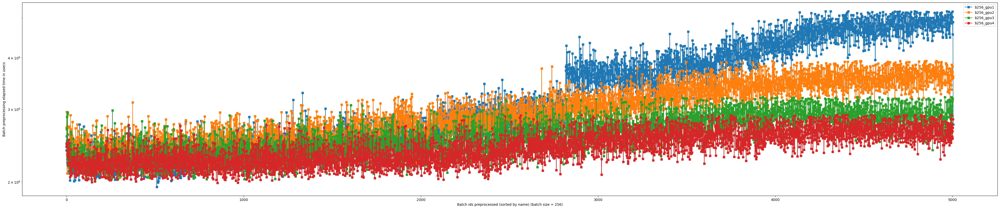

avg = 5066577.25 usecs, std = 425251.80 (8.39% of avg) usecs, min = 4249810.03 usecs, max = 6026454.11 usecs
/mydata/pytorch_custom_log_one_epoch_imagenet_dataset/b512_gpu2
b512_gpu2:
Before removing outliers:
avg = 4733286.46 usecs, std = 341213.91 (7.21% of avg) usecs , min = 1309314.46 usecs, max = 5925188.69 usecs
After removing outliers:
avg = 4717323.28 usecs, std = 312821.82 (6.63% of avg) usecs, min = 4085515.86 usecs, max = 5413226.43 usecs
/mydata/pytorch_custom_log_one_epoch_imagenet_dataset/b512_gpu3
b512_gpu3:
Before removing outliers:
avg = 4632320.84 usecs, std = 343780.29 (7.42% of avg) usecs , min = 1340928.64 usecs, max = 6030944.07 usecs
After removing outliers:
avg = 4610290.99 usecs, std = 311874.83 (6.76% of avg) usecs, min = 3974995.31 usecs, max = 5318997.23 usecs
/mydata/pytorch_custom_log_one_epoch_imagenet_dataset/b512_gpu4
b512_gpu4:
Before removing outliers:
avg = 4593355.73 usecs, std = 314432.28 (6.85% of avg) usecs , min = 1533147.63 usecs, max = 5773388

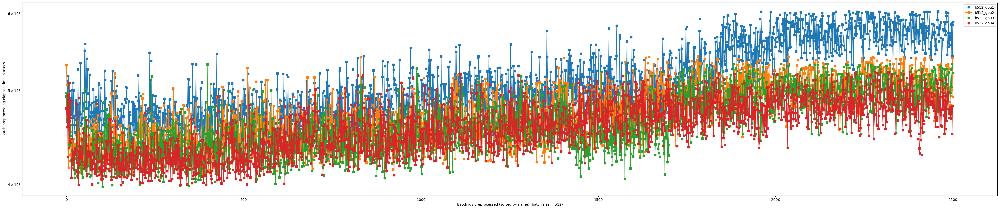

avg = 9263973.06 usecs, std = 483384.06 (5.22% of avg) usecs, min = 8240766.41 usecs, max = 10418041.31 usecs
/mydata/pytorch_custom_log_one_epoch_imagenet_dataset/b1024_gpu3
b1024_gpu3:
Before removing outliers:
avg = 8990515.22 usecs, std = 479956.18 (5.34% of avg) usecs , min = 1393415.89 usecs, max = 10827866.39 usecs
After removing outliers:
avg = 8970146.35 usecs, std = 385641.48 (4.30% of avg) usecs, min = 8074508.83 usecs, max = 9941499.47 usecs
/mydata/pytorch_custom_log_one_epoch_imagenet_dataset/b1024_gpu4
b1024_gpu4:
Before removing outliers:
avg = 8871863.66 usecs, std = 417908.74 (4.71% of avg) usecs , min = 1287057.53 usecs, max = 10533926.88 usecs
After removing outliers:
avg = 8862586.06 usecs, std = 336643.81 (3.80% of avg) usecs, min = 8067687.94 usecs, max = 9701657.13 usecs


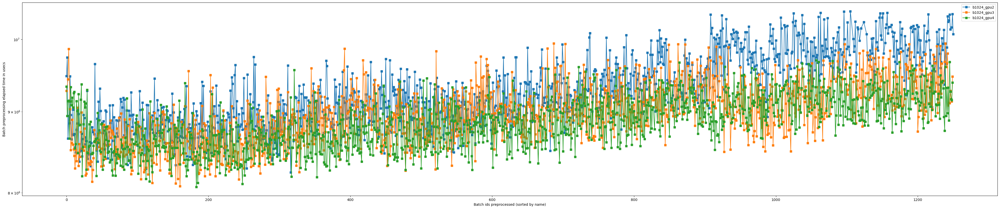

In [4]:
plotter_preprocessing_time(imagenet_target_dir,sort_by=sort_criteria,remove_outliers=True)

/mydata/pytorch_custom_log_one_epoch_synthetic_dataset/
/mydata/pytorch_custom_log_one_epoch_synthetic_dataset/filesize10MB_b128_gpu4
filesize10MB_b128_gpu4:
avg = 1039467070.56 usecs, std = 11263143.70 (1.08% of avg) usecs, min = 1027226086.11 usecs, max = 1068545229.15 usecs
/mydata/pytorch_custom_log_one_epoch_synthetic_dataset/filesize10MB_b256_gpu4
filesize10MB_b256_gpu4:


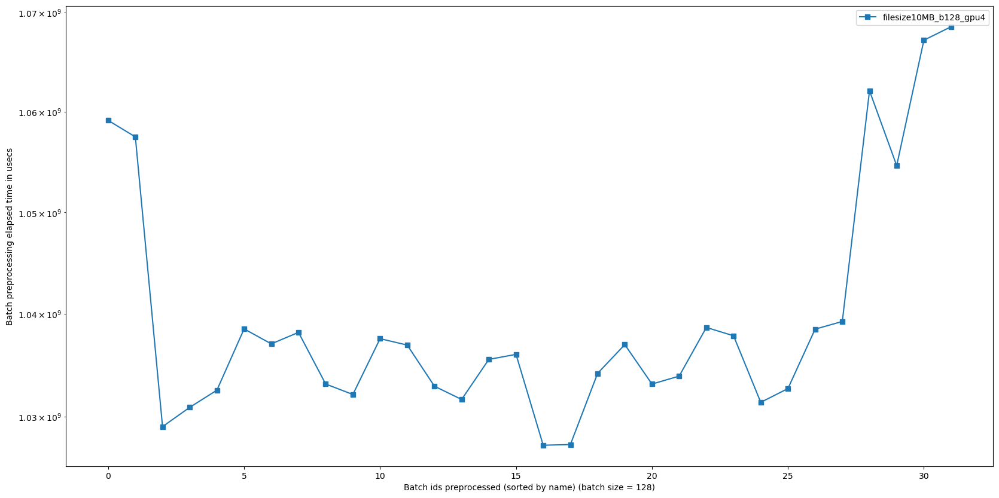

avg = 2070854709.13 usecs, std = 14734913.44 (0.71% of avg) usecs, min = 2056624577.09 usecs, max = 2123945514.56 usecs
/mydata/pytorch_custom_log_one_epoch_synthetic_dataset/glibc
/mydata/pytorch_custom_log_one_epoch_synthetic_dataset/glibc/filesize1MB_b128_gpu4
filesize1MB_b128_gpu4:


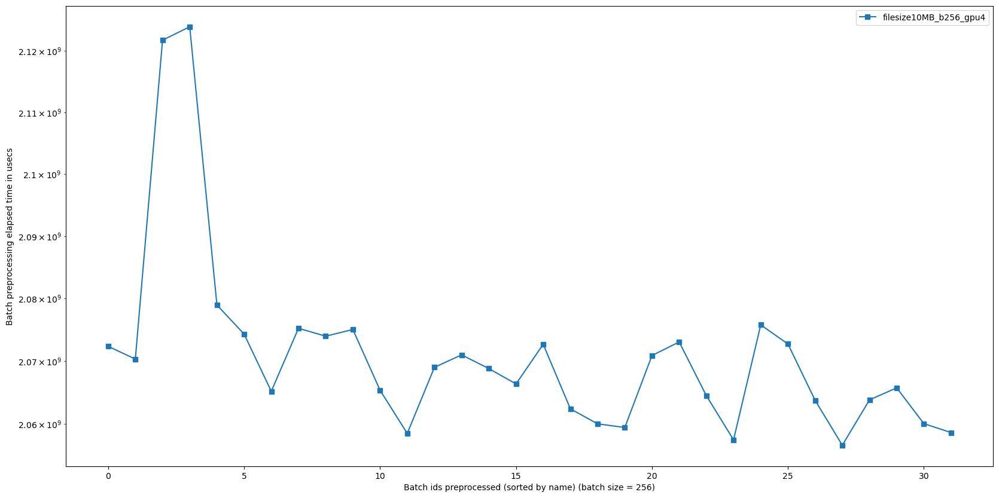

avg = 110667127.47 usecs, std = 1743704.52 (1.58% of avg) usecs, min = 108003237.17 usecs, max = 115503333.91 usecs
/mydata/pytorch_custom_log_one_epoch_synthetic_dataset/glibc/filesize10MB_b128_gpu4
filesize10MB_b128_gpu4:
avg = 1031820121.11 usecs, std = 5744077.67 (0.56% of avg) usecs, min = 1021231990.86 usecs, max = 1044059365.62 usecs
/mydata/pytorch_custom_log_one_epoch_synthetic_dataset/glibc/filesize100MB_b128_gpu4
filesize100MB_b128_gpu4:
avg = 1474001797.43 usecs, std = 9198585.75 (0.62% of avg) usecs, min = 1453794036.54 usecs, max = 1489656372.92 usecs
/mydata/pytorch_custom_log_one_epoch_synthetic_dataset/jemalloc
/mydata/pytorch_custom_log_one_epoch_synthetic_dataset/jemalloc/filesize1MB_b128_gpu4
filesize1MB_b128_gpu4:
avg = 120415225.41 usecs, std = 1048913.28 (0.87% of avg) usecs, min = 118223953.37 usecs, max = 123616989.44 usecs
/mydata/pytorch_custom_log_one_epoch_synthetic_dataset/jemalloc/filesize10MB_b128_gpu4
filesize10MB_b128_gpu4:
avg = 1057298057.12 usecs, s

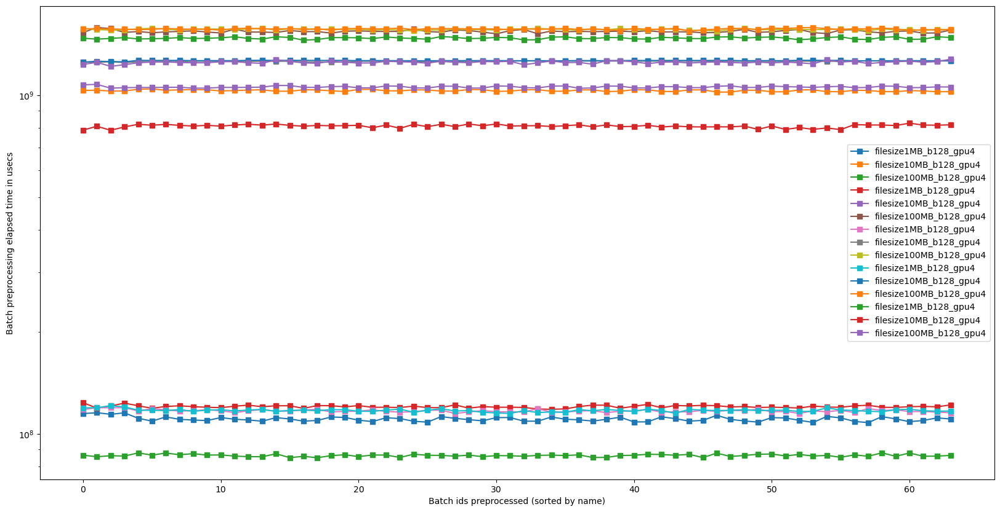

In [5]:
plotter_preprocessing_time(synthetic_target_dir,sort_by=sort_criteria,fig_size=(20,10),remove_outliers=False,fig_prefix='synthetic')

In [11]:
# sort_by = 'name' or 'duration'
def plotter_preprocessing_wait_time(target_dir,sort_by='name',fig_size=(50,10),fig_prefix=''):
    plt.figure(figsize=fig_size)
    root_to_files = {}
    for root, dirs, files in os.walk(target_dir):
        root_to_files[root] = files
    roots = sorted(root_to_files, key=lambda x: natsort.natsort_key(x.lower()))
    
    prev_batch = None
    
    for root in roots:
        print (root)
        files = root_to_files[root]
        plot_df = pd.DataFrame()
        for file in files:
            if not file.startswith('custom_log_main_pid_'):
                continue

            df = pd.read_csv(os.path.join(root, file)
                            , header=None)

            # add header
            df.columns = ['name','start_ts','duration']

            # names that start with 'SBatchWait'
            df = df[df['name'].str.startswith('SBatchWait')]

            # map 'SBatchWait' such that 'SBatchWait_idx' becomes 'idx' where idx is an integer
            df['name'] = df['name'].map(lambda x: int(x.replace('SBatchWait_','')))

            # divide by 1000 to convert from nanoseconds to microseconds
            df['duration'] = df['duration']/1000

            # concatentate all dataframes
            plot_df = pd.concat([plot_df, df])
        
        if plot_df.empty:
            continue

        label = root.split('/')[-1] # retrieves b128_gpu4 kind of label
        batch = root.split('/')[-1].split('b')[1].split('_')[0] # <long_dir_path> -> 128_gpu4 -> 128

        print(f'{label}:')

        if prev_batch is None:
            prev_batch = batch 
        elif batch != prev_batch:

            # plt.figure(figsize=fig_size)
            plt.gcf().set_size_inches(fig_size[0], fig_size[1])
            # label x axis
            plt.xlabel(f'Batch ids preprocessed (sorted by {sort_by}) (batch size = {prev_batch})')
            # label y axis
            plt.ylabel('Batch preprocessing elapsed time in usecs')
            plt.legend()
            
            plt.show()
            prev_batch = batch 

        mean = np.mean(plot_df["duration"])
        std = np.std(plot_df["duration"])
        minimum = plot_df["duration"].min()
        maximum = plot_df["duration"].max() 
        print (f'avg = {mean:.2f} usecs, std = {std:.2f} ({100*std/mean:.2f}% of avg) usecs, min = {minimum:.2f} usecs, max = {maximum:.2f} usecs')
        # print % of batches which had very low wait time given by 100 usecs pretty print
        print (f'{100*len(plot_df[plot_df["duration"] < 100])/len(plot_df):.2f}% of batches had wait time < {100} usecs')
        
        # sort by sort_by
        plot_df = plot_df.sort_values(by=[sort_by])
        plt.plot(plot_df['name'], plot_df['duration'], label=label)

        # plt.scatter(plot_df['name'], plot_df['duration'], label=label)
        # plot on log scale
        plt.yscale('log')

    plt.gcf().set_size_inches(fig_size[0], fig_size[1])
    # label x axis
    plt.xlabel(f'Wait time for batch ids preprocessed (sorted by {sort_by})')
    # label y axis
    plt.ylabel('Batch wait time in usecs')
    plt.legend()
    plt.show()


/mydata/pytorch_custom_log_one_epoch_imagenet_dataset/
/mydata/pytorch_custom_log_one_epoch_imagenet_dataset/b128_gpu1
b128_gpu1:
avg = 1473672.86 usecs, std = 331621.54 (22.50% of avg) usecs, min = 55.27 usecs, max = 2837322.25 usecs
0.01% of batches had wait time < 100 usecs
/mydata/pytorch_custom_log_one_epoch_imagenet_dataset/b128_gpu2
b128_gpu2:
avg = 675274.41 usecs, std = 513205.84 (76.00% of avg) usecs, min = 9.75 usecs, max = 2315331.06 usecs
5.00% of batches had wait time < 100 usecs
/mydata/pytorch_custom_log_one_epoch_imagenet_dataset/b128_gpu3
b128_gpu3:
avg = 439584.19 usecs, std = 376796.72 (85.72% of avg) usecs, min = 8.70 usecs, max = 2076081.88 usecs
5.53% of batches had wait time < 100 usecs
/mydata/pytorch_custom_log_one_epoch_imagenet_dataset/b128_gpu4
b128_gpu4:
avg = 317784.76 usecs, std = 307381.53 (96.73% of avg) usecs, min = 8.38 usecs, max = 1926491.38 usecs
8.36% of batches had wait time < 100 usecs
/mydata/pytorch_custom_log_one_epoch_imagenet_dataset/b256_

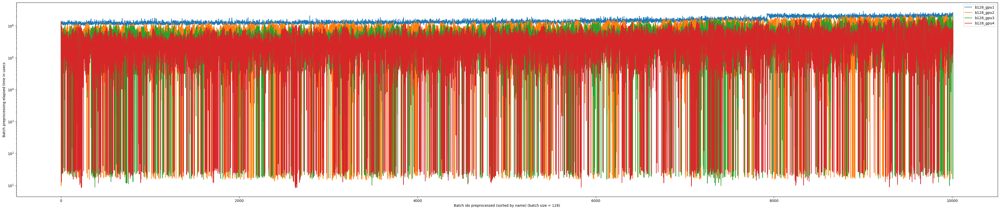

avg = 3173222.90 usecs, std = 961243.57 (30.29% of avg) usecs, min = 198644.82 usecs, max = 5769790.25 usecs
0.00% of batches had wait time < 100 usecs
/mydata/pytorch_custom_log_one_epoch_imagenet_dataset/b256_gpu2
b256_gpu2:
avg = 1393310.28 usecs, std = 1162979.83 (83.47% of avg) usecs, min = 11.75 usecs, max = 3942850.92 usecs
4.84% of batches had wait time < 100 usecs
/mydata/pytorch_custom_log_one_epoch_imagenet_dataset/b256_gpu3
b256_gpu3:
avg = 785525.05 usecs, std = 805166.39 (102.50% of avg) usecs, min = 9.28 usecs, max = 3090237.50 usecs
7.05% of batches had wait time < 100 usecs
/mydata/pytorch_custom_log_one_epoch_imagenet_dataset/b256_gpu4
b256_gpu4:
avg = 531783.39 usecs, std = 460710.87 (86.64% of avg) usecs, min = 9.71 usecs, max = 2581338.46 usecs
3.94% of batches had wait time < 100 usecs
/mydata/pytorch_custom_log_one_epoch_imagenet_dataset/b512_gpu1
b512_gpu1:


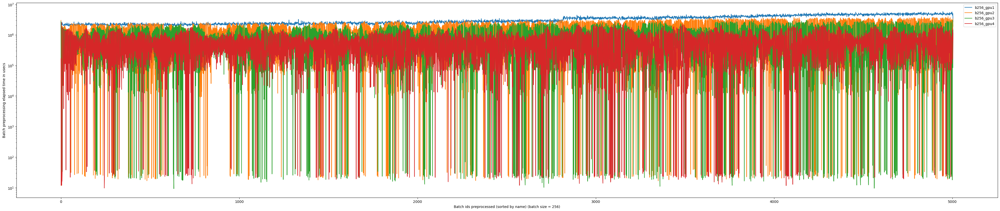

avg = 4897143.53 usecs, std = 474570.88 (9.69% of avg) usecs, min = 1197590.43 usecs, max = 6363245.06 usecs
0.00% of batches had wait time < 100 usecs
/mydata/pytorch_custom_log_one_epoch_imagenet_dataset/b512_gpu2
b512_gpu2:
avg = 2163517.47 usecs, std = 1535390.82 (70.97% of avg) usecs, min = 10.71 usecs, max = 5693800.77 usecs
1.88% of batches had wait time < 100 usecs
/mydata/pytorch_custom_log_one_epoch_imagenet_dataset/b512_gpu3
b512_gpu3:
avg = 1359761.46 usecs, std = 1484718.64 (109.19% of avg) usecs, min = 9.05 usecs, max = 5043813.06 usecs
6.43% of batches had wait time < 100 usecs
/mydata/pytorch_custom_log_one_epoch_imagenet_dataset/b512_gpu4
b512_gpu4:
avg = 1000472.24 usecs, std = 963823.04 (96.34% of avg) usecs, min = 9.90 usecs, max = 5187614.21 usecs
3.88% of batches had wait time < 100 usecs
/mydata/pytorch_custom_log_one_epoch_imagenet_dataset/b1024_gpu2
b1024_gpu2:


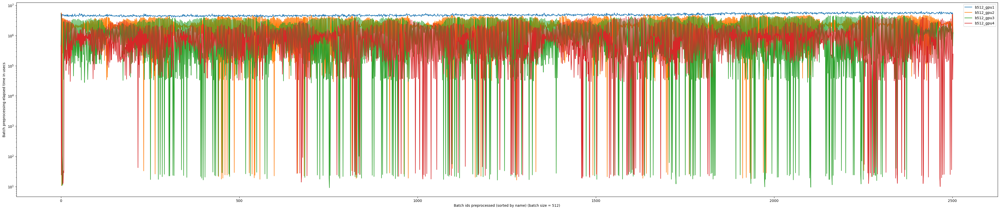

avg = 4268148.75 usecs, std = 3344657.54 (78.36% of avg) usecs, min = 16.83 usecs, max = 10601067.35 usecs
2.08% of batches had wait time < 100 usecs
/mydata/pytorch_custom_log_one_epoch_imagenet_dataset/b1024_gpu3
b1024_gpu3:
avg = 2665588.77 usecs, std = 3086858.67 (115.80% of avg) usecs, min = 9.02 usecs, max = 10047136.49 usecs
6.47% of batches had wait time < 100 usecs
/mydata/pytorch_custom_log_one_epoch_imagenet_dataset/b1024_gpu4
b1024_gpu4:
avg = 1933090.45 usecs, std = 1894852.89 (98.02% of avg) usecs, min = 13.86 usecs, max = 9762307.35 usecs
2.96% of batches had wait time < 100 usecs


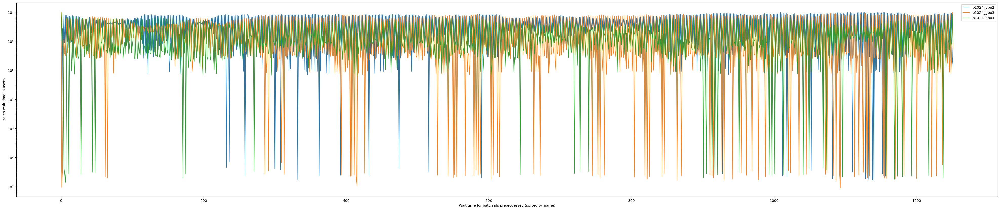

In [12]:
plotter_preprocessing_wait_time(imagenet_target_dir,sort_by='name')

/mydata/pytorch_custom_log_one_epoch_synthetic_dataset/
/mydata/pytorch_custom_log_one_epoch_synthetic_dataset/filesize10MB_b128_gpu4
filesize10MB_b128_gpu4:
avg = 259853345.99 usecs, std = 439347066.53 (169.08% of avg) usecs, min = 1034787.42 usecs, max = 1052127071.26 usecs
0.00% of batches had wait time < 100 usecs
/mydata/pytorch_custom_log_one_epoch_synthetic_dataset/filesize10MB_b256_gpu4
filesize10MB_b256_gpu4:


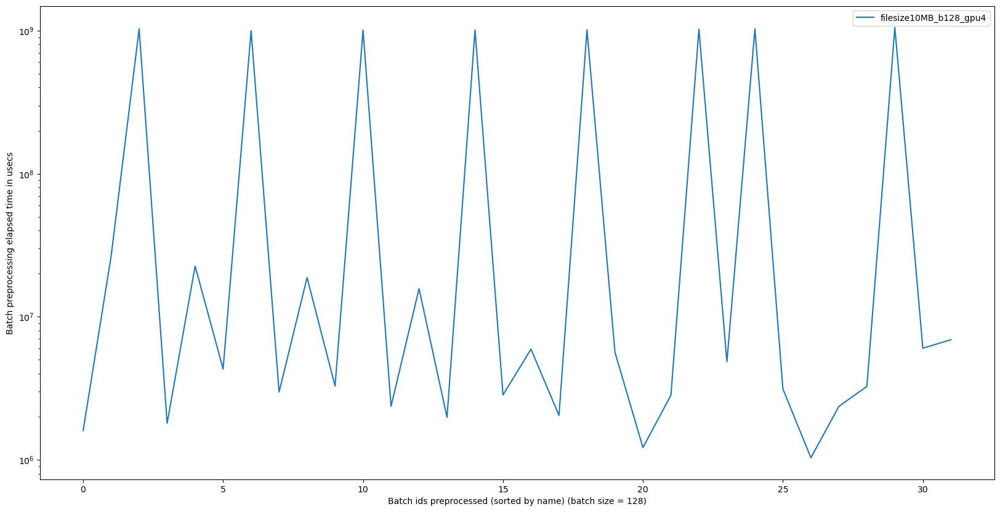

avg = 517714375.32 usecs, std = 878256476.52 (169.64% of avg) usecs, min = 1204063.40 usecs, max = 2070643909.34 usecs
0.00% of batches had wait time < 100 usecs
/mydata/pytorch_custom_log_one_epoch_synthetic_dataset/glibc
/mydata/pytorch_custom_log_one_epoch_synthetic_dataset/glibc/filesize1MB_b128_gpu4
filesize1MB_b128_gpu4:


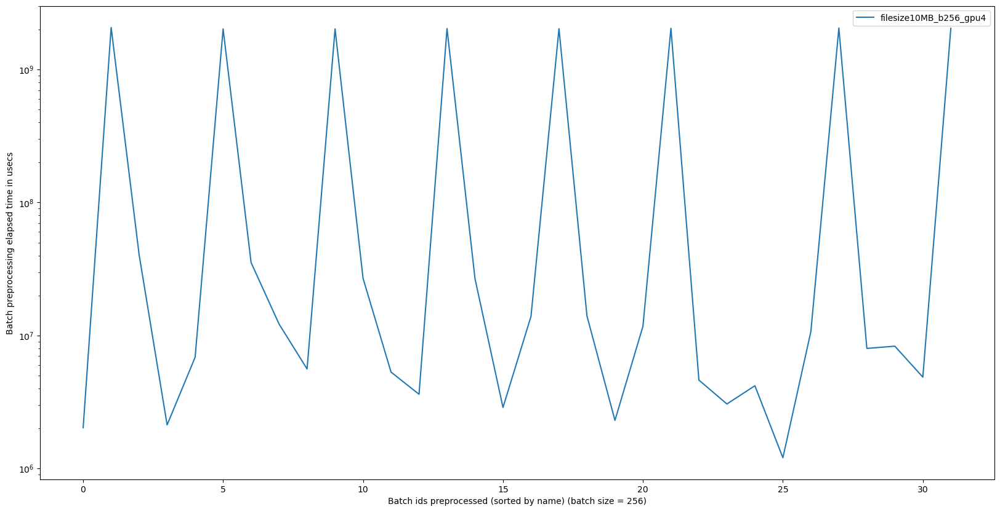

avg = 27843137.71 usecs, std = 37153018.14 (133.44% of avg) usecs, min = 20.88 usecs, max = 114387771.04 usecs
3.12% of batches had wait time < 100 usecs
/mydata/pytorch_custom_log_one_epoch_synthetic_dataset/glibc/filesize10MB_b128_gpu4
filesize10MB_b128_gpu4:
avg = 258987589.23 usecs, std = 404693865.24 (156.26% of avg) usecs, min = 52.70 usecs, max = 1028654972.05 usecs
1.56% of batches had wait time < 100 usecs
/mydata/pytorch_custom_log_one_epoch_synthetic_dataset/glibc/filesize100MB_b128_gpu4
filesize100MB_b128_gpu4:
avg = 370234031.41 usecs, std = 572973125.51 (154.76% of avg) usecs, min = 34.79 usecs, max = 1463802760.31 usecs
1.56% of batches had wait time < 100 usecs
/mydata/pytorch_custom_log_one_epoch_synthetic_dataset/jemalloc
/mydata/pytorch_custom_log_one_epoch_synthetic_dataset/jemalloc/filesize1MB_b128_gpu4
filesize1MB_b128_gpu4:
avg = 29961675.32 usecs, std = 47954368.15 (160.05% of avg) usecs, min = 26.96 usecs, max = 119323886.24 usecs
1.56% of batches had wait time

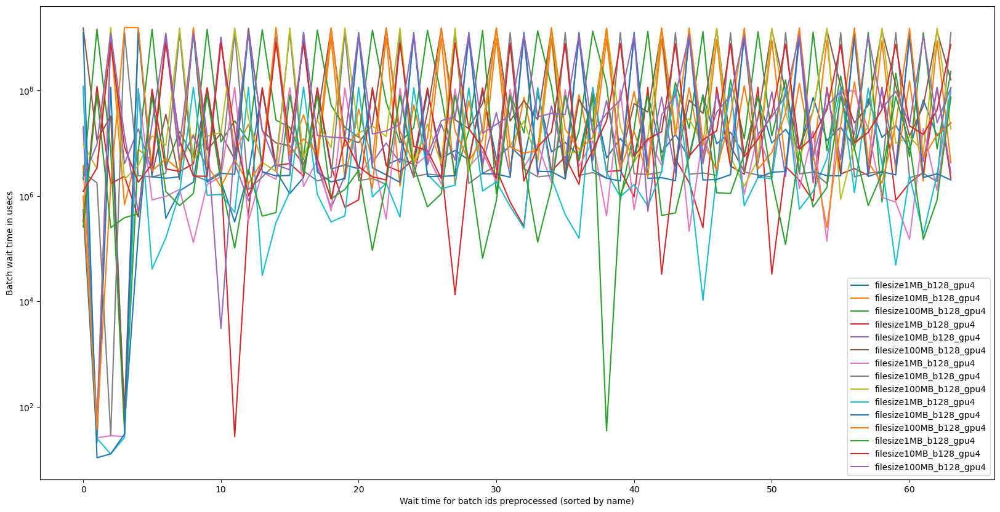

In [13]:
plotter_preprocessing_wait_time(synthetic_target_dir,sort_by=sort_criteria,fig_size=(20,10),fig_prefix='synthetic')